## Цели практической работы

* Изучить и предобработать данные в задаче оттока.

* Научиться применять для решения задачи решающие деревья и оценивать результаты модели.

## Что входит в практическую работу

*  Загрузка и предобработка данных.
*  Применение и настройка линейных моделей.
*  Применение и настройка решающего дерева.
*  Сравнение моделей.
*  Оценка важности признаков.

## Что оценивается

Выполнены все задания ноутбука (заполнены пустые ячейки, даны ответы на вопросы).

## Что нужно сделать
Решите задачу классификации оттоковых клиентов телекома: для каждого клиента необходимо определить, перестанет он пользоваться услугами оператора в ближайшее время или нет.

In [1]:
%reload_ext autoreload
%autoreload 2

In [2]:
import warnings

import pandas as pd
import numpy as np
import EDA_functions
import modeling_functions

warnings.filterwarnings("ignore")

In [3]:
df = pd.read_csv("data/telecom_churn.csv")
df.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


Сделайте первичную обработку данных:

1. Выбросите колонку State.

2. Колонки International plan и Voice mail plan закодируйте следующим образом: Yes замените на 1, а No на 0.

3. Переведите целевую переменную (Churn) в числа: True в 1, а False в 0.

In [4]:
df = df.drop(columns=["State"])
df['International plan'] = df['International plan'].map({'Yes': 1, 'No': 0})
df['Voice mail plan'] = df['Voice mail plan'].map({'Yes': 1, 'No': 0})
df['target'] = df['Churn'].astype(int)
df = df.drop(columns=["Churn"])


Выведите на экран первые строки изменённой таблицы, чтобы проверить, что все преобразования сработали.

In [5]:
df.head()

,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,target
0,128,415,0,1,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,0
1,107,415,0,1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0
2,137,415,0,0,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0
3,84,408,1,0,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0
4,75,415,1,0,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0


In [6]:
df.columns

Index(['Account length', 'Area code', 'International plan', 'Voice mail plan',
       'Number vmail messages', 'Total day minutes', 'Total day calls',
       'Total day charge', 'Total eve minutes', 'Total eve calls',
       'Total eve charge', 'Total night minutes', 'Total night calls',
       'Total night charge', 'Total intl minutes', 'Total intl calls',
       'Total intl charge', 'Customer service calls', 'target'],
      dtype='object')

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Account length          3333 non-null   int64  
 1   Area code               3333 non-null   int64  
 2   International plan      3333 non-null   int64  
 3   Voice mail plan         3333 non-null   int64  
 4   Number vmail messages   3333 non-null   int64  
 5   Total day minutes       3333 non-null   float64
 6   Total day calls         3333 non-null   int64  
 7   Total day charge        3333 non-null   float64
 8   Total eve minutes       3333 non-null   float64
 9   Total eve calls         3333 non-null   int64  
 10  Total eve charge        3333 non-null   float64
 11  Total night minutes     3333 non-null   float64
 12  Total night calls       3333 non-null   int64  
 13  Total night charge      3333 non-null   float64
 14  Total intl minutes      3333 non-null   

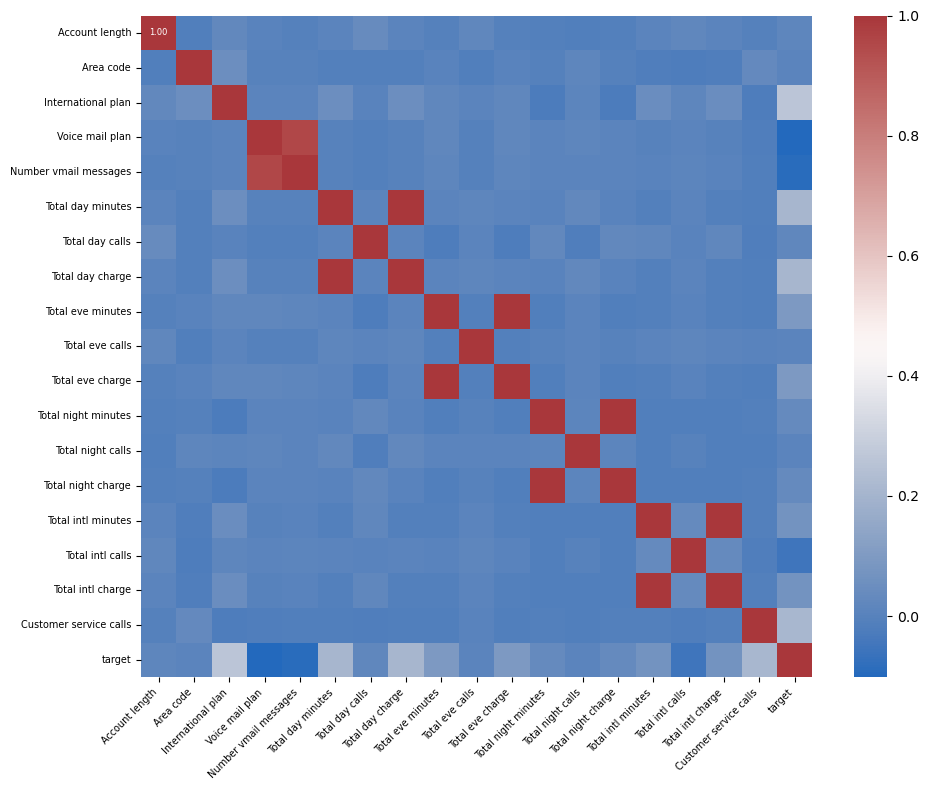

In [8]:
# Посмотрим на матрицу корреляции признаков
EDA_functions.show_correlation_heatmap(df)

#### В очередной раз удаление сильно коррелированных признаков приводит к ухудшению всех моделей.

In [9]:
# надо будет попробовать удалить их
# correlated_features = [
#     "Total day minutes",
#     "Total eve minutes",
#     "Total night minutes",
#     "Total intl minutes",]

In [10]:
# df = df.drop(columns=correlated_features)

### Вячеслав, научите, как читать следующие графики, пожалуйста. Вижу, что значения местами "разъезжаются", т.е. заметно делятся по какому-то критерию, но не понимаю, как это мне может помочь. Мне электронный болван уже рассказал многое по этому графику, но всё равно мне этого мало для понимания.

Я знаю, что в первую очередь надо смотреть на диагональ, там выглядывать смещение и несколько горбов, но что делать с этой информацией, я не представляю.

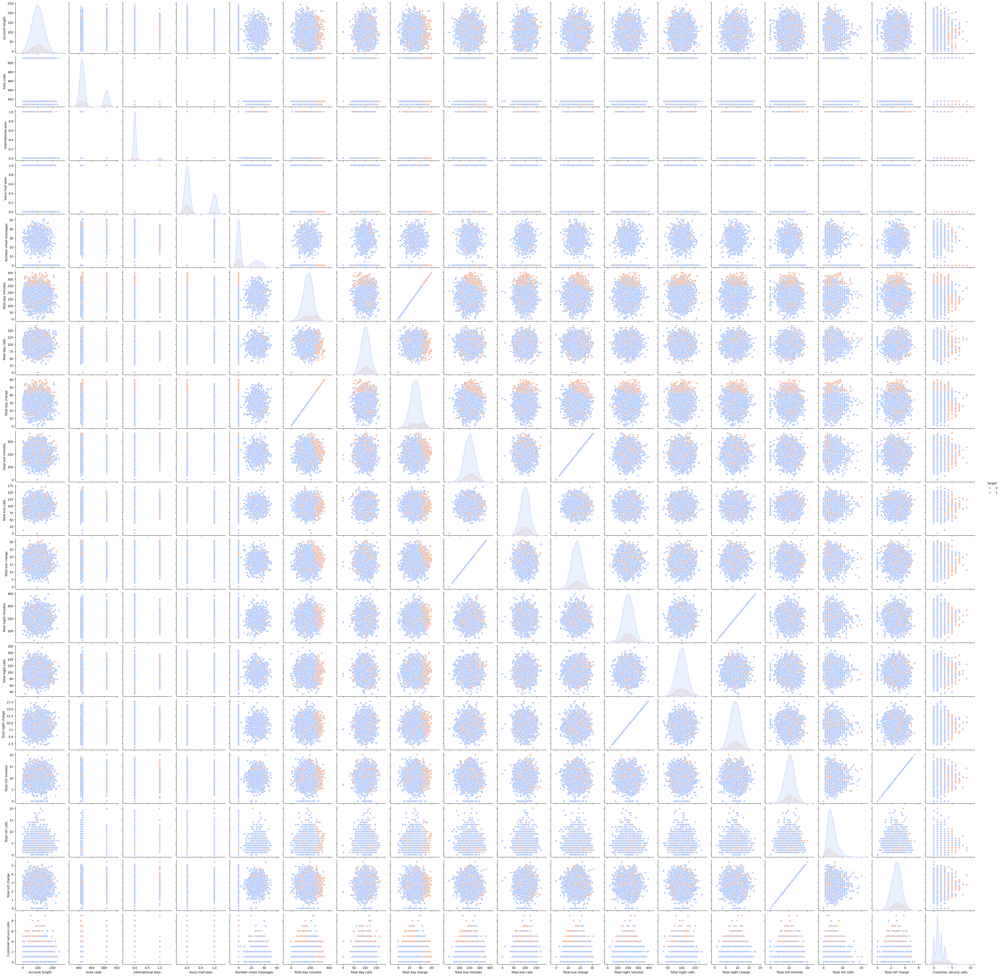

In [11]:
EDA_functions.show_pair_plot(df)

Создайте матрицу объект-признак X и вектор с целевой переменной (Churn) y.

In [12]:
X = df.drop(columns=["target"])
y = df["target"]

Проверьте баланс классов. Является ли выборка сбалансированной?

In [13]:
y.value_counts()

target
0    2850
1     483
Name: count, dtype: int64

#### А как вам такой поворот событий?

(Надо не забыть проверить без смота, а посредством стратификации)

In [14]:
from imblearn.over_sampling import SMOTE

X_smote, y_smote = SMOTE().fit_resample(X, y)

print("X_smote shape:", X_smote.shape)
print("y_smote shape:", y_smote.shape)
print("y_smote value_counts:", y_smote.value_counts())

X_smote shape: (5700, 18)
y_smote shape: (5700,)
y_smote value_counts: target
0    2850
1    2850
Name: count, dtype: int64


#### Стратификация рядом со СМОТом, что твоя моська рядом со слоном, если коротко. 

In [15]:
# from sklearn.model_selection import train_test_split

# X_train, X_test, y_train, y_test = train_test_split(
#     X, y, test_size=0.3, random_state=42, stratify=y
# )

# splits = [X_train, X_test, y_train, y_test]

Разбейте данные на тренировочную и тестовую части, размер тестовой части — 30%.

In [16]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X_smote, y_smote, test_size=0.3, random_state=42
)

splits = [X_train, X_test, y_train, y_test]

Для линейных моделей очень важно масштабирование признаков. Поэтому отмасштабируйте признаки при помощи [StandardScaler](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html), обучив метод на тренировочных данных и применив его и к трейну, и к тесту.

In [17]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

splits_scaled = [X_train_scaled, X_test_scaled, y_train, y_test]

После масштабирования признаков X_train и X_test перестали быть объектами типа pd.DataFrame, это неудобно. Приведите их снова к pd.DataFrame.

In [18]:
# Нет, не перестали. Я шкалированные признаки запихнул в собственные переменные. 
# По-моему, так удобнее.

Обучите на тренировочных данных с параметрами по умолчанию:

1) логистическую регрессию;

2) метод опорных векторов (с kernel='linear').

In [19]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier

lr_baseline = LogisticRegression(max_iter=1000)
svm_baseline = SVC(kernel="linear", probability=True)
dtc_baseline = DecisionTreeClassifier(random_state=137)

lr_baseline.fit(X_train_scaled, y_train)
svm_baseline.fit(X_train_scaled, y_train)
dtc_baseline.fit(X_train_scaled, y_train)

DecisionTreeClassifier(random_state=137)

С помощью обученных моделей сделайте предсказание на тестовых данных. Вычислите значение метрики roc-auc на тесте. 

Не забудьте, что для корректного вычисления roc-auc необходимо предсказывать не сами классы, а их вероятности (чтобы SVC мог это сделать, при объявлении модели поставьте probability=True).

Теперь обучите решающее дерево с параметрами по умолчанию на тренировочных данных, сделайте предсказание на тесте и вычислите на тесте roc-auc.

In [20]:
modeling_functions.get_roc_auc_score([lr_baseline, svm_baseline, dtc_baseline], splits_scaled)

LogisticRegression       : 74.39%
SVC                      : 73.95%
DecisionTreeClassifier   : 87.14%


Нужно ли масшабировать признаки для обучения решающего дерева? Проверьте это, заново разбив данные на тренировочную и тестовую части (назовите новые полученные объекты новыми названиями), и проведите обучение, предсказание и оценку метрики до масштабирования и после.

#### Нет, не нужно. Результат не меняется.

In [21]:
# dtc_unweighted = DecisionTreeClassifier(random_state=137)

# dtc_unweighted.fit(X_train, y_train)

# modeling_functions.get_roc_auc_score([dtc_unweighted], splits)

Какой вывод про масштабирование признаков для обучения дерева можно сделать?

Теперь ваша цель — максимально улучшить модели. Для этого:

1) у линейных моделей подберите гиперпараметр С (переберите 20 значений C в диапазоне от 0.1 до 10 с равным шагом);

2) у решающего дерева подберите max_depth (переберите глубину от 1 до 10 с шагом 1) и criterion — gini или entropy (см. [документацию](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html)).

Для подбора параметров используйте [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html) с пятью фолдами и метрикой roc-auc или обычные циклы.

Подбор параметров осуществляется только по тренировочным данным!

После подбора гиперпараметров обучите модели с найденными гиперпараметрами на тренировочных данных, сделайте предсказания на тесте и оцените их качество (roc_auc).

#### После долгих подборов, я нашёл наилучшие параметры и сразу втыкаю их в модели, чтобы не тратить время на поиски. К слову, дольше всего подбирал гиперпараметры я, ясен пончик, под decision tree и по закону Мёрфи (если такой есть, в противном случае надо придумать) наилучшие гиперпараметры — это гиперпараметры по умолчанию.

In [22]:
lr_params = {
    # 'C': np.arange(0.1, 20, 0.5),
    # 'penalty': ['l2'],
    # 'solver': ['lbfgs', 'saga'],
    # 'class_weight': ['balanced', None],
}

svm_params = {
    # 'C': np.arange(0.1, 20, 0.5),
    # 'kernel': ['linear', 'rbf', 'poly'],
    # 'gamma': ['scale', 'auto'],
    # 'class_weight': ['balanced', None]
}

dtc_params = {
    # 'criterion': ['gini', 'entropy', 'log_loss'],          # Критерий разбиения
    # 'splitter': ['best', 'random'],                        # Стратегия выбора разбиения
    # 'max_depth': [None, 5, 10, 15, 20, 25, 30],            # Максимальная глубина дерева
    # 'min_samples_split': [2, 5, 10, 15],                   # Минимальное количество объектов для разбиения
    # 'min_samples_leaf': [1, 2, 4, 6, 8],                   # Минимальное количество объектов в листе
    # 'max_features': [None, 'sqrt', 'log2'],                # Максимальное количество признаков для разбиения
    # 'max_leaf_nodes': [None, 10, 20, 30, 40],              # Максимальное количество листьев
    # 'min_weight_fraction_leaf': [0.0, 0.01, 0.05],         # Минимальная доля веса для листа
    # 'class_weight': [None, 'balanced'],                    # Взвешивание классов
    # 'ccp_alpha': [0.0, 0.01, 0.1, 0.001],                  # Параметр для минимальной стоимости разбиения (post-pruning)
}

# {'splitter': 'best', 'min_samples_split': 5, 'min_samples_leaf': 8, 'max_features': None, 'max_depth': 30, 'criterion': 'entropy'}

In [23]:
lr = LogisticRegression(
    max_iter=1000,
    random_state=137,
    C=17.6,
    penalty="l2",
    solver="saga",
    class_weight="balanced",
)

# lr_softmax = LogisticRegression(
#     multi_class="multinomial",
#     solver="lbfgs",
#     C=1,
#     class_weight="balanced",
#     penalty="l2",
# )

svm = SVC(
    C=17.6,
    probability=True,
    random_state=137,
    kernel="rbf",
    class_weight="balanced",
    gamma="auto",
)

dtc = DecisionTreeClassifier(random_state=137)

best_lr = modeling_functions.tune_model(lr, lr_params, splits_scaled)
# best_lr_softmax = modeling_functions.tune_model(lr_softmax, lr_params, splits_scaled)
best_svm = modeling_functions.tune_model(svm, svm_params, splits_scaled)
best_dtc = modeling_functions.tune_model(dtc, dtc_params, splits_scaled)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
The best parameters for LogisticRegression:
{}

Fitting 5 folds for each of 1 candidates, totalling 5 fits
The best parameters for SVC:
{}

Fitting 5 folds for each of 1 candidates, totalling 5 fits
The best parameters for DecisionTreeClassifier:
{}



In [24]:
modeling_functions.get_roc_auc_score(
    [best_lr, best_svm, best_dtc], splits_scaled
)

LogisticRegression       : 74.72%
SVC                      : 92.10%
DecisionTreeClassifier   : 87.14%


#### С линейным ядром в SVC был самый низкий показатель. Видимо, нам сказали установить данное ядро, чтобы продемонстрировать крутизну решающего дерева. Однако, он выходит на свежий воздух из нашего самолёта, если в SVM выставить в качестве ядра rbf.

Какая модель справилась с решением задачи лучше всего по метрике roc-auc?

Нарисуйте roc-кривую для наилучшей модели.

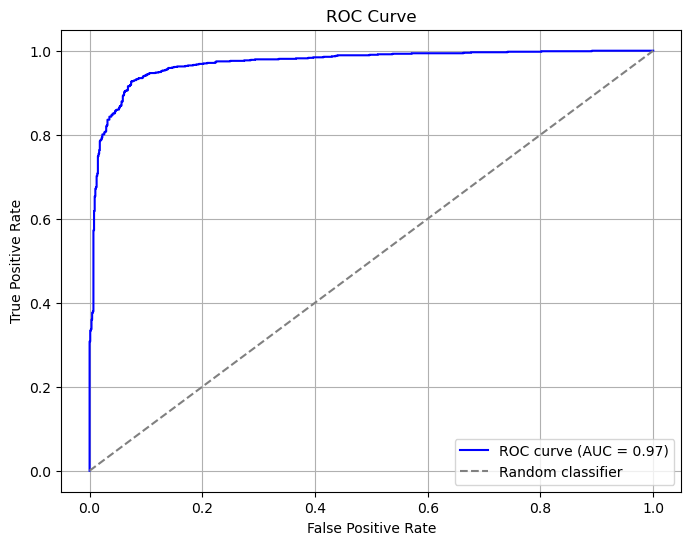

In [25]:
modeling_functions.plot_roc_curve(best_svm, splits_scaled)

Сравните между собой две лучшие модели:

1. Насколько сильно отличается качество предсказания на тестовых данных?
(Вычислите разность значений roc-auc.)

2. Постройте гистограммы важности признаков (для линейных моделей берите модуль значений весов) для каждой из этих моделей. Сравните между собой списки из трёх самых важных признаков. Совпадают ли они?

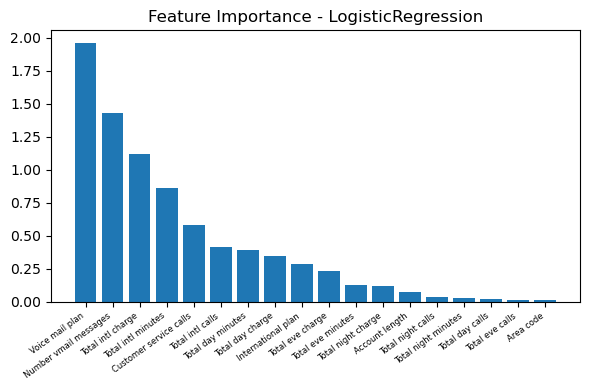

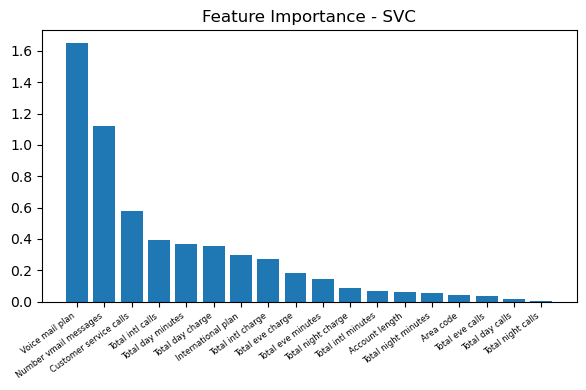

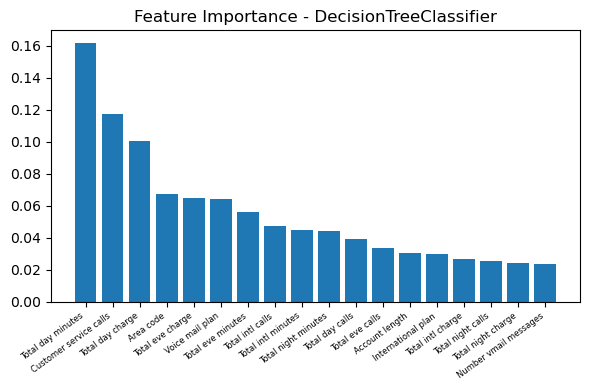

In [26]:
modeling_functions.plot_feature_importances([best_lr, svm_baseline, best_dtc], X_train)

## Выводы.

#### Вывод №1.
##### Являются ли данные сбалансированными? Что это означает?

Нет, не являются. Это означает, что надо из чуланов доставать бубны и выплясывать по-всякому. Лично я на текущий момент знаю следующие варианты: 
- выставлять class_weights='balanced';
- использовать стратификацию на разбиении совокупности;
- использовать SMOTE.

#### Вывод №2.
##### Какая модель после подбора гиперпараметров лучше всего решает задачу с точки зрения метрики roc-auc?
SVM c ядром rbf.

#### Вывод №3.
##### Одинаковые ли признаки важны для работы двух наилучших моделей? Почему?
Нет. Тому есть ряд причин:
- Разные методы оценки. В логрег используются веса, в СВМ — опорные векторы, деревья — чисто дровоколы.
- Линейные модели учитывают лишь линейные зависимости, тогда как SVM может вылавливать, соответственно, нелинейные.
- Модели по-разному реагируют на масштаб и выбросы.

Всё вышеперечисленное и выливается в различную значимость признаков.

#### Вывод №4.
Удивительно, что наилучший вариант для решающего дерева получился на бейзлайне (на СМОТе): 88.24%.
Сколько бы я ни баловался с Рандом- или ГридСёрчем — абсолютно все показывали худший результат. Вот уж где мудрить было не надо.

#### Вывод №5.
Логрег на софтмаксе показала результат чуть хуже, чем логрег, подобранная через гридсёрч. Удивился. Во всех предыдущих работах она заруливала всех в минуса!

#### Вывод №6.
В очередной раз удаление сильно коррелированных признаков привело к ухудшению всех моделей. Несмотря на то, что электронный болван с иногда поддакивающей интуицей напару несколько раз говорили, что их надо удалять. А вот поди ж ты.

#### Вывод №7.
Последний, но, наверное, самый важный вывод: SMOTE рулит!!! 


In [27]:
# ========================================
# 2024-11-15 17:50:41.328802
# stratify - best by GS
# ========================================
# LogisticRegression       : 74.97%
# SVC                      : 75.18%
# DecisionTreeClassifier   : 80.88%

# ========================================
# 2024-11-15 18:13:22.954267
# back to SMOTE - best by GS
# ========================================
# LogisticRegression       : 74.72%
# SVC                      : 92.10%
# DecisionTreeClassifier   : 87.14%
